In [6]:
# import easyocr
import pandas as pd
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
import matplotlib.pyplot as plt

from PIL import Image
import pytesseract
from pytesseract import Output
import numpy as np
import cv2
import easyocr


In [17]:
# image_path = r"./OCR_Images/简历模糊版本.png"
# image = cv2.imread(image_path)

# easyOCR
reader = easyocr.Reader(['en'],gpu = False)
result = reader.readtext(image, detail = 0)

print(result)
plt.imshow(image)

Using CPU. Note: This module is much faster with a GPU.


ValueError: Invalid input type. Supporting format = string(file path or url), bytes, numpy array

In [19]:
pytesseract.pytesseract.tesseract_cmd = '/usr/local/bin/tesseract'
# pytesseract
image_path = r"./OCR/imges/ocrtest_shift.png"
image = cv2.imread(image_path)

text = pytesseract.image_to_string(image)
print(text)

CAUTION

WET
FLOOR «



CAUTION

WET
FLOOR «



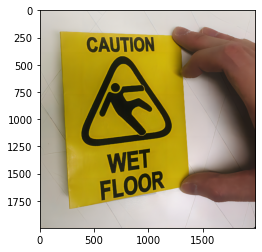

In [18]:
# pytesseract
image_path = r"./OCR/imges/ocrtest_shift.png"
image = cv2.imread(image_path)

text = pytesseract.image_to_string(image)
print(text)

results = pytesseract.image_to_data(image, output_type=Output.DICT)
results = results['text']
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.imshow(image, cmap='gray')

In [20]:
# Filter out empty text
test = pd.DataFrame(results['text'], columns=['text'])
test = test[(test['text'].str.isspace()==False) & (test['text'].str.len() != 0)]
test

TypeError: list indices must be integers or slices, not str

In [12]:
test_image = image.copy()

for i in range(0, len(results["text"])):
   x = results["left"][i]
   y = results["top"][i]

   w = results["width"][i]
   h = results["height"][i]

   text = results["text"][i]
   conf = int(results["conf"][i])
   

   if conf > 70 and text.isspace() == False:
       text = "".join([c if ord(c) < 128 else "" for c in text]).strip()
       cv2.rectangle(test_image, (x, y), (x + w, y + h), (0, 255, 0), 5)
       cv2.putText(test_image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 5)
plt.imshow(test_image, cmap='gray')

TypeError: list indices must be integers or slices, not str

# Below are image processing, we could ignore them for now!

In [5]:
image_path = "Desktop/ocrtest.jpg"
# image = r"./OCR_Images/ocrtest_shift.png"

image = cv2.imread(image_path)
reader = easyocr.Reader(['en'], gpu = False) # need to run only once to load model into memory
result = reader.readtext(image, detail = 0)
plt.imshow(image, cmap = 'gray')

Using CPU. Note: This module is much faster with a GPU.


ValueError: Invalid input type. Supporting format = string(file path or url), bytes, numpy array

In [118]:
result

['1', '6', '8']

In [44]:
def display(filePath):
    dpi = 80
    im_data = plt.imread(filePath)
    height, width, depth = im_data.shape
    
    # what size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)
    
    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    
    # Hide spines, ticks, etc.
    ax.axis('off')
    
    # Display the image.
    ax.imshow(im_data, cmap='gray')
    
    plt.show()

In [16]:
# Image preprocessing
image_path = './OCR_Images/ocrtest.jpg'
image = cv2.imread(image_path)
display(image_path)

'./OCR_Images/ocrtest.jpg'

In [46]:
# Inverted image(反转图像)
inverted_image = cv2.bitwise_not(image)
cv2.imwrite('./OCR_Images/inverted_image.jpg', inverted_image)


True

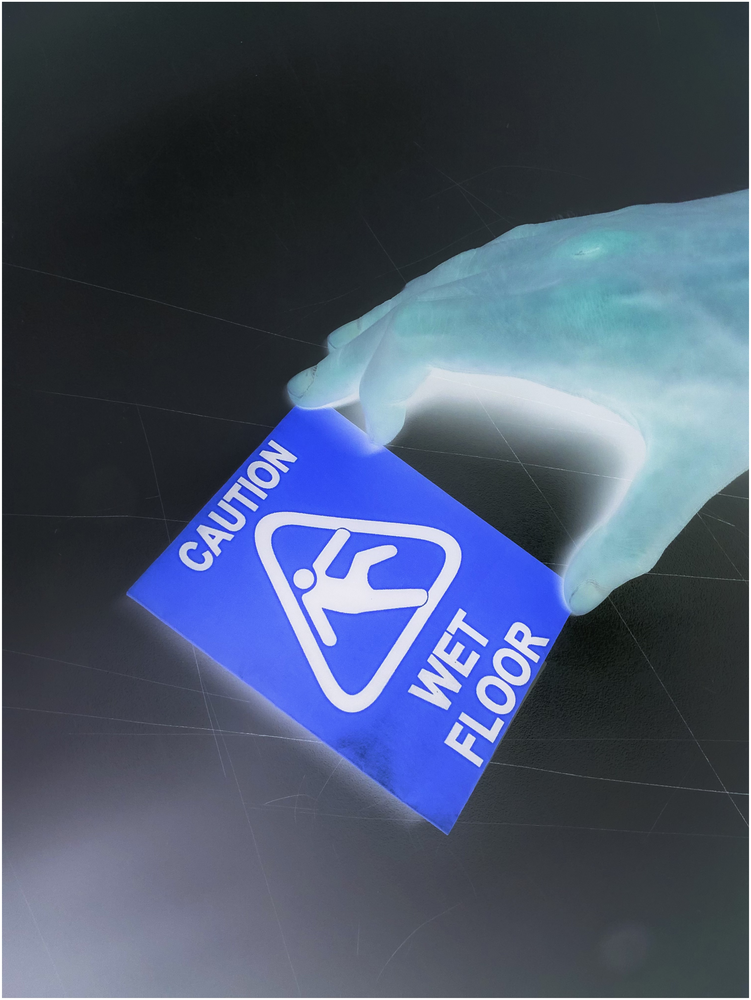

In [47]:
display('./OCR_Images/inverted_image.jpg')

In [48]:
# Rescale Image(缩放)
# 晚些时候做

# Binarization(二值化)
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [49]:
gray_image = grayscale(image)
cv2.imwrite('./OCR_Images/gray_image.jpg', gray_image)

True

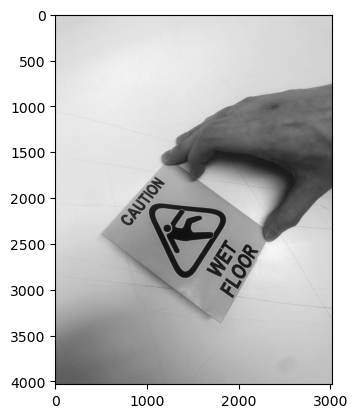

In [55]:
# im_data = plt.imread("gray_image.jpg")
# height, width, depth = im_data.shape
# display('./gray_image.jpg')
plt.imshow(gray_image, cmap='gray')

In [61]:
thresh, im_bw = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)
cv2.imwrite('./OCR_Images/im_bw.jpg', im_bw)

True

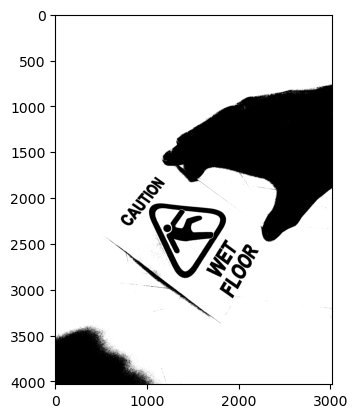

In [62]:
plt.imshow(im_bw, cmap='gray')

In [70]:
def noise_removal(image):
    kernal = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernal, iterations=1)
    kernal = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernal, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernal)
    image = cv2.medianBlur(image, 3)
    return image

no_noise = noise_removal(im_bw)
cv2.imwrite('./OCR_Images/no_noise.jpg', no_noise)

True

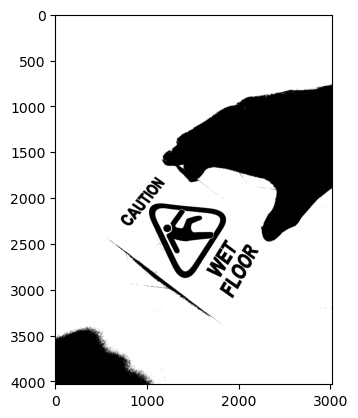

In [72]:
plt.imshow(no_noise, cmap='gray')

In [73]:
# Dialation and Erosion(膨胀和腐蚀)
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernal = np.ones((2, 2), np.uint8)
    image = cv2.erode(image, kernal, iterations=1)
    image = cv2.bitwise_not(image)
    return image

eroded_image = thin_font(no_noise)
cv2.imwrite('./OCR_Images/eroded_image.jpg', eroded_image)

True

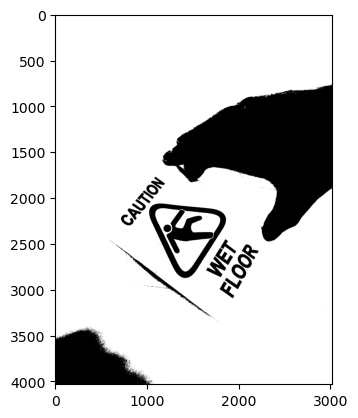

In [74]:
plt.imshow(eroded_image, cmap='gray')

In [75]:
def thick_font(image):
    image = cv2.bitwise_not(image)
    kernal = np.ones((2, 2), np.uint8)
    image = cv2.dilate(image, kernal, iterations=1)
    image = cv2.bitwise_not(image)
    return image

dialeted_image = thick_font(no_noise)
cv2.imwrite('./OCR_Images/dialeted_image.jpg', dialeted_image)

True

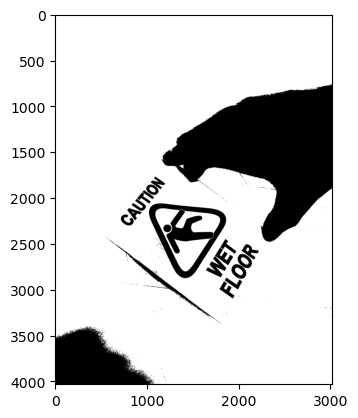

In [76]:
plt.imshow(dialeted_image, cmap='gray')

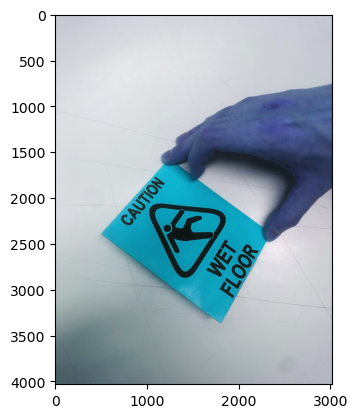

In [112]:
# img1 = np.array(Image.open('./OCR_Images/ocrtest_shift.png'))
img = cv2.imread('./OCR_Images/ocrtest_shift.png')
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
# img = cv2.medianBlur(img, 3)
norm_img = np.zeros((img.shape[0], img.shape[1]))
img = cv2.normalize(img, norm_img, 0, 255, cv2.NORM_MINMAX)
# img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]
# img = cv2.GaussianBlur(img, (1, 1), 0)
text = pytesseract.image_to_string(img)
results = pytesseract.image_to_data(image, output_type=Output.DICT)
print(text)
plt.imshow(img, cmap='gray')

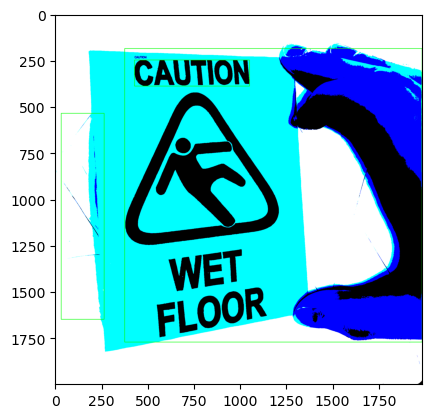

In [93]:
for i in range(0, len(results["text"])):
   x = results["left"][i]
   y = results["top"][i]

   w = results["width"][i]
   h = results["height"][i]

   text = results["text"][i]
   conf = int(results["conf"][i])

   if conf > 70:
       text = "".join([c if ord(c) < 128 else "" for c in text]).strip()
       cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
       cv2.putText(img, text, (x, y - 10), 
cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 200), 2)
plt.imshow(img, cmap='gray')

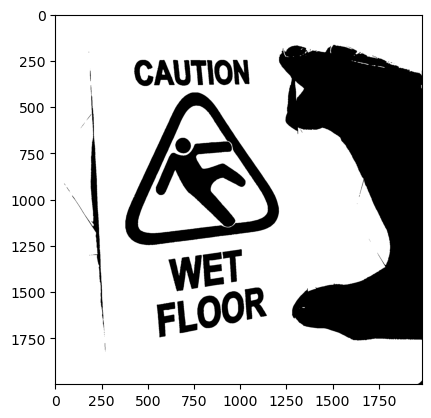

In [79]:
plt.imshow(img, cmap='gray')